### Part 01. Load packages and libs

In [1]:
import os
import time
import warnings
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torchvision.models as models
from torch.utils.data import Dataset, DataLoader
from torchsummary import summary

from tqdm import tqdm
import albumentations as A
from albumentations.pytorch import ToTensorV2

torch.cuda.empty_cache()

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

warnings.filterwarnings("ignore")

c:\Users\minht\anaconda3\envs\pydl\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


### Part 02. Writing a custom dataset for Blood Cell Segmemtation dataset, write data loader to load data for train model

In [2]:
TRAIN_IMG_DIR = "datasets/kvasir_v1/train/images"
TRAIN_MASK_DIR = "datasets/kvasir_v1/train/masks"
VAL_IMG_DIR = "datasets/kvasir_v1/test/images"
VAL_MASK_DIR = "datasets/kvasir_v1/test/masks"

In [3]:
class BloodCellDataset(Dataset):
    def __init__(self, image_dir, mask_dir, transform=None) -> None:
        super(BloodCellDataset, self).__init__()
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.transform = transform
        self.images = os.listdir(image_dir)

    def __len__(self):
        return len(self.images)

    def __getitem__(self, index):
        image_path = os.path.join(self.image_dir, self.images[index])
        mask_path = os.path.join(
            self.mask_dir, self.images[index])

        image = np.array(Image.open(image_path).convert("RGB"))
        mask = np.array(Image.open(mask_path).convert("L"),
                        dtype=np.float32)  # l -> grayscale
        # mask[mask == 255.0] = 1.0
        mask = np.where(mask > 155.0, 1.0, 0.0)

        if self.transform is not None:
            augemantations = self.transform(image=image, mask=mask)
            image = augemantations['image']
            mask = augemantations['mask']
        return image, mask

In [4]:
def get_data_loaders(
        train_dir, train_mask_dir, val_dir, val_maskdir, batch_size,
        train_transform, val_transform):

    train_ds = BloodCellDataset(
        image_dir=train_dir, mask_dir=train_mask_dir,
        transform=train_transform)

    train_loader = DataLoader(
        train_ds,
        batch_size=batch_size,
        shuffle=True,
    )

    val_ds = BloodCellDataset(
        image_dir=val_dir,
        mask_dir=val_maskdir,
        transform=val_transform,
    )

    val_loader = DataLoader(
        val_ds,
        batch_size=batch_size,
        shuffle=False,
    )

    return train_loader, val_loader

In [5]:
train_transform = A.Compose(
    [
        A.Resize(height=256, width=256),
        A.Normalize(
            mean=[0.0, 0.0, 0.0],
            std=[1.0, 1.0, 1.0],
            max_pixel_value=255.0,
        ),
        ToTensorV2(),
    ],
)

val_transforms = A.Compose(
    [
        A.Resize(height=256, width=256),
        A.Normalize(
            mean=[0.0, 0.0, 0.0],
            std=[1.0, 1.0, 1.0],
            max_pixel_value=255.0,
        ),
        ToTensorV2(),
    ],
)

In [6]:
BATCH_SIZE = 6

train_loader, val_loader = get_data_loaders(
    TRAIN_IMG_DIR,
    TRAIN_MASK_DIR,
    VAL_IMG_DIR,
    VAL_MASK_DIR,
    BATCH_SIZE,
    train_transform,
    val_transforms
)

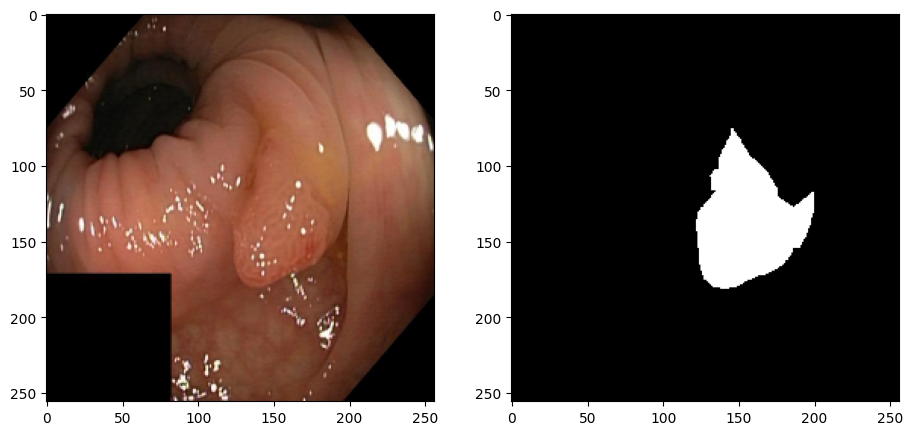

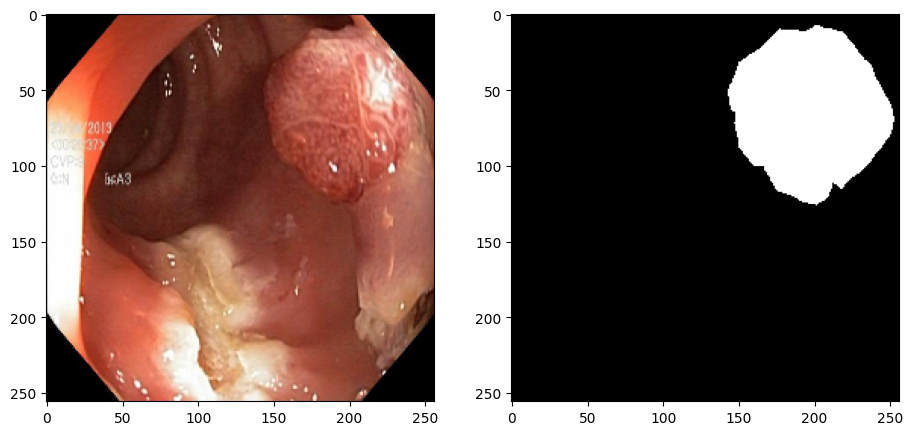

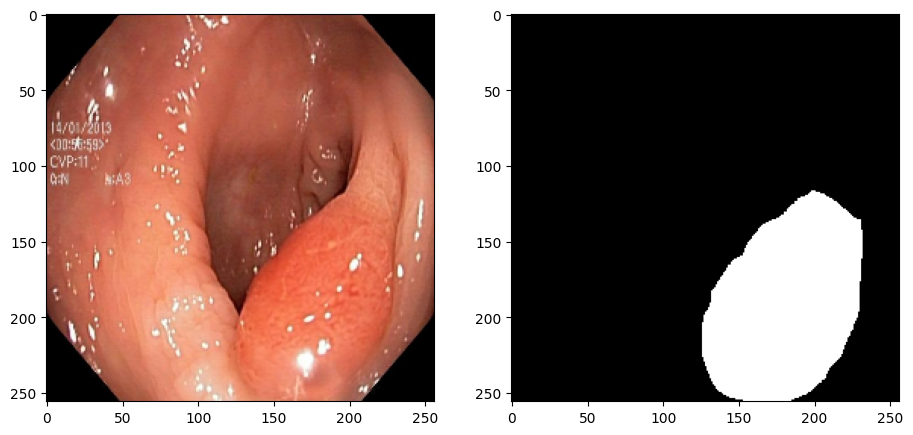

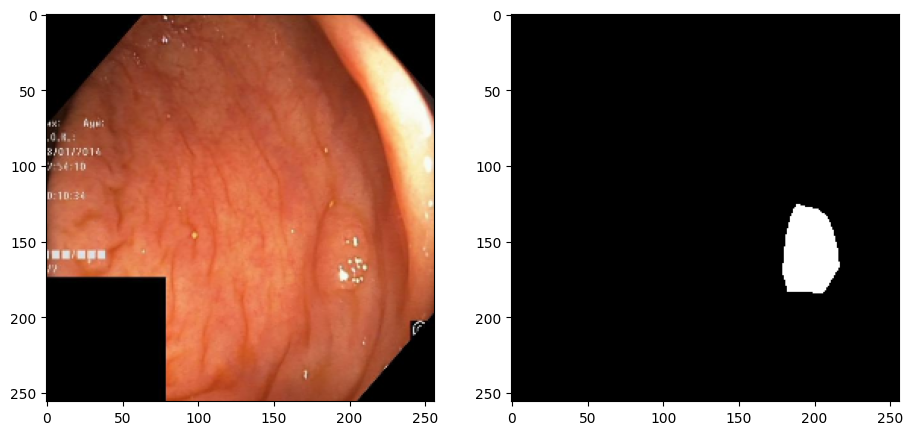

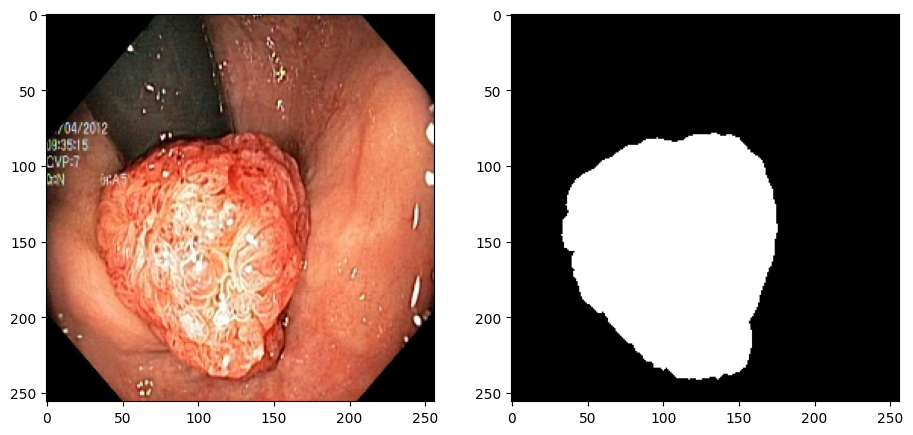

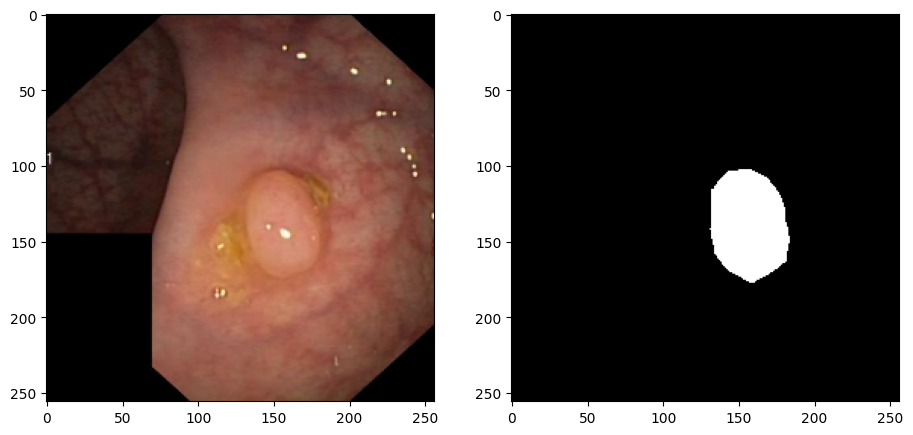

In [7]:
def show_transformed(data_loader):
    batch = next(iter(data_loader))
    images, labels = batch

    for img, mask in zip(images, labels):
        plt.figure(figsize=(11, 11))

        plt.subplot(1, 2, 1)
        plt.imshow(np.transpose(img, (1, 2, 0)))

        plt.subplot(1, 2, 2)
        # plt.imshow(mask.reshape(mask.shape[0], mask.shape[1], 1))
        plt.imshow(mask, cmap="gray")


show_transformed(val_loader)

In [8]:
train_loader.dataset[0][0].shape
train_loader.dataset[0][1].shape

torch.Size([256, 256])

In [9]:
class DiceBCELoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(DiceBCELoss, self).__init__()
        self.bce_losss = nn.BCEWithLogitsLoss()

    def forward(self, inputs, targets, smooth=1):
        BCE = self.bce_losss(inputs, targets)
        inputs = torch.sigmoid(inputs)

        inputs = inputs.view(-1)
        targets = targets.view(-1)

        intersection = (inputs * targets).sum()
        dice_loss = 1 - (2.*intersection + smooth)/(
            inputs.sum() + targets.sum() + smooth)
        Dice_BCE = BCE + dice_loss
        return Dice_BCE

class IOU(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(IOU, self).__init__()

    def forward(self, inputs, targets, smooth=1):
        inputs = torch.sigmoid(inputs)

        inputs = inputs.view(-1)
        targets = targets.view(-1)

        intersection = (inputs * targets).sum()
        total = (inputs + targets).sum()
        union = total - intersection

        IoU = (intersection + smooth)/(union + smooth)
        return IoU

In [10]:
class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels, mid_channels=None):
        super().__init__()

        if not mid_channels:
            mid_channels = out_channels
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, mid_channels,
                      kernel_size=3, padding=1, bias=False),
            # nn.BatchNorm2d(mid_channels),
            nn.ReLU(inplace=True),

            nn.Conv2d(mid_channels, out_channels,
                      kernel_size=3, padding=1, bias=False),
            # nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.double_conv(x)

In [11]:
class Down(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()

        self.maxpool_conv = nn.Sequential(
            nn.MaxPool2d(2),
            DoubleConv(in_channels, out_channels)
        )

    def forward(self, x):
        return self.maxpool_conv(x)

In [12]:
class Up(nn.Module):
    def __init__(self, in_channels, out_channels, bilinear=True):
        super().__init__()

        if bilinear:
            self.up = nn.Upsample(
                scale_factor=2, mode='bilinear', align_corners=True)
            self.conb = DoubleConv(in_channels, out_channels, in_channels // 2)
        else:
            self.up = nn.ConvTranspose2d(
                in_channels, in_channels // 2, kernel_size=2, stride=2)
            self.conv = DoubleConv(in_channels, out_channels)

    def forward(self, x1, x2):
        x1 = self.up(x1)

        diffY = x2.size()[2] - x1.size()[2]
        diffX = x2.size()[3] - x1.size()[3]

        x1 = F.pad(x1, [diffX // 2, diffX - diffX // 2,
                        diffY // 2, diffY - diffY // 2])

        x = torch.cat([x2, x1], dim=1)
        return self.conv(x)

In [13]:
class OutConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(OutConv, self).__init__()

        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=1)

    def forward(self, x):
        return self.conv(x)

In [14]:
class UNet(nn.Module):
    def __init__(self, n_channels, n_classes, bilinear=False):
        super(UNet, self).__init__()

        self.n_channels = n_channels
        self.n_classes = n_classes
        self.bilinear = bilinear

        self.input = DoubleConv(n_channels, 32)
        self.down1 = Down(32, 64)
        self.down2 = Down(64, 128)
        self.down3 = Down(128, 256)

        factor = 2 if bilinear else 1
        self.down4 = Down(256, 512)

        self.up1 = Up(512, 256 // factor, bilinear)
        self.up2 = Up(256, 128 // factor, bilinear)
        self.up3 = Up(128, 64 // factor, bilinear)
        self.up4 = Up(64, 32, bilinear)

        self.outc = OutConv(32, n_classes)

    def forward(self, x):

        x1 = self.input(x)
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)
        x5 = self.down4(x4)

        x = self.up1(x5, x4)
        x = self.up2(x, x3)
        x = self.up3(x, x2)
        x = self.up4(x, x1)

        output = self.outc(x)
        return output

    def use_checkpointing(self):
        self.input = torch.utils.checkpoint(self.input)
        self.down1 = torch.utils.checkpoint(self.down1)
        self.down2 = torch.utils.checkpoint(self.down2)
        self.down3 = torch.utils.checkpoint(self.down3)
        self.down4 = torch.utils.checkpoint(self.down4)
        self.up1 = torch.utils.checkpoint(self.up1)
        self.up2 = torch.utils.checkpoint(self.up2)
        self.up3 = torch.utils.checkpoint(self.up3)
        self.up4 = torch.utils.checkpoint(self.up4)
        self.outc = torch.utils.checkpoint(self.outc)

In [15]:
model = UNet(n_channels=3, n_classes=1).to(DEVICE)
loss_fn = DiceBCELoss()

iou_fn = IOU()
scaler = torch.cuda.amp.GradScaler()
LEARNING_RATE = 1e-4
optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)

train_iou = []
train_loss = []
train_dice = []

def save_checkpoint(state, filename="model.pth.tar"):
    print("=> Saving checkpoint")
    # torch.save(state, filename)

In [16]:
summary(model, (3, 256, 256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 256, 256]             864
              ReLU-2         [-1, 32, 256, 256]               0
            Conv2d-3         [-1, 32, 256, 256]           9,216
              ReLU-4         [-1, 32, 256, 256]               0
        DoubleConv-5         [-1, 32, 256, 256]               0
         MaxPool2d-6         [-1, 32, 128, 128]               0
            Conv2d-7         [-1, 64, 128, 128]          18,432
              ReLU-8         [-1, 64, 128, 128]               0
            Conv2d-9         [-1, 64, 128, 128]          36,864
             ReLU-10         [-1, 64, 128, 128]               0
       DoubleConv-11         [-1, 64, 128, 128]               0
             Down-12         [-1, 64, 128, 128]               0
        MaxPool2d-13           [-1, 64, 64, 64]               0
           Conv2d-14          [-1, 128,

In [17]:
model

UNet(
  (input): DoubleConv(
    (double_conv): Sequential(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (1): ReLU(inplace=True)
      (2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (3): ReLU(inplace=True)
    )
  )
  (down1): Down(
    (maxpool_conv): Sequential(
      (0): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (1): DoubleConv(
        (double_conv): Sequential(
          (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (1): ReLU(inplace=True)
          (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (3): ReLU(inplace=True)
        )
      )
    )
  )
  (down2): Down(
    (maxpool_conv): Sequential(
      (0): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (1): DoubleConv(
        (double_conv): Sequential(
          (0): Conv2d(64,

In [18]:
print(model)

UNet(
  (input): DoubleConv(
    (double_conv): Sequential(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (1): ReLU(inplace=True)
      (2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (3): ReLU(inplace=True)
    )
  )
  (down1): Down(
    (maxpool_conv): Sequential(
      (0): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (1): DoubleConv(
        (double_conv): Sequential(
          (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (1): ReLU(inplace=True)
          (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (3): ReLU(inplace=True)
        )
      )
    )
  )
  (down2): Down(
    (maxpool_conv): Sequential(
      (0): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (1): DoubleConv(
        (double_conv): Sequential(
          (0): Conv2d(64,

In [19]:
start_time = time.time()

# let's train it just for 2 epochs
NUM_EPOCHS = 22

for epoch in range(NUM_EPOCHS):
    print(f"Epoch: {epoch+1}/{NUM_EPOCHS}")

    iterations = 0
    iter_loss = 0.0
    iter_iou = 0.0

    batch_loop = tqdm(train_loader)
    for batch_idx, (data, targets) in enumerate(batch_loop):

        data = data.to(device=DEVICE)
        targets = targets.float().unsqueeze(1).to(device=DEVICE)

        with torch.cuda.amp.autocast():
        # with torch.autocast(device_type=DEVICE, dtype=torch.bfloat16):
            predictions = model(data)
            loss = loss_fn(predictions, targets)
            iou = iou_fn(predictions, targets)

            iter_loss += loss.item()
            iter_iou += iou.item()

        optimizer.zero_grad()
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        iterations += 1
        batch_loop.set_postfix(diceloss=loss.item(), iou=iou.item())

    train_loss.append(iter_loss / iterations)
    train_iou.append(iter_iou / iterations)
    # print(
    #     f"Epoch: {epoch+1}/{NUM_EPOCHS}, Training loss: {round(train_loss[-1] , 3)}")
    print(f"Epoch: {epoch+1}/{NUM_EPOCHS}, IoU score: {iter_iou / iterations}")

    checkpoint = {
        "state_dict": model.state_dict(),
        "optimizer": optimizer.state_dict()
    }
    # save_checkpoint(checkpoint)

    num_correct = 0
    num_pixels = 0
    dice_score = 0
    model.eval()

    with torch.no_grad():
        for x, y in val_loader:
            x = x.to(DEVICE)
            y = y.to(DEVICE).unsqueeze(1)
            preds = torch.sigmoid(model(x))
            preds = (preds > 0.5).float()
            num_correct += (preds == y).sum()
            num_pixels += torch.numel(preds)
            dice_score += (2 * (preds * y).sum()) / (
                (preds + y).sum() + 1e-8
            )

    # print(
    #     f"Got {num_correct}/{num_pixels} with acc {num_correct/num_pixels*100:.2f}"
    # )
    print(
        f"Epoch: {epoch+1}/{NUM_EPOCHS}, Total num_correct/num_pixels: {num_correct}/{num_pixels} => {num_correct/num_pixels}"
    )
    print(
        f"Epoch: {epoch+1}/{NUM_EPOCHS}, Dice score: {dice_score / len(val_loader)}")
    train_dice.append(dice_score / len(val_loader))
    model.train()

print("done ..")

end_time = time.time()
training_time = end_time - start_time
print(
    f"The training time of the UNET model is: {training_time:.2f} seconds")

Epoch: 1/22


100%|██████████| 134/134 [11:37<00:00,  5.21s/it, diceloss=1.39, iou=0.113] 


Epoch: 1/22, IoU score: 0.12007421038266439
Epoch: 1/22, Total num_correct/num_pixels: 11175870/13107200 => 0.8526512384414673
Epoch: 1/22, Dice score: 0.0
Epoch: 2/22


100%|██████████| 134/134 [14:35<00:00,  6.54s/it, diceloss=1.2, iou=0.0981] 


Epoch: 2/22, IoU score: 0.1907224200888356
Epoch: 2/22, Total num_correct/num_pixels: 10937051/13107200 => 0.8344307541847229
Epoch: 2/22, Dice score: 0.3937442726919085
Epoch: 3/22


100%|██████████| 134/134 [14:48<00:00,  6.63s/it, diceloss=1.15, iou=0.128] 


Epoch: 3/22, IoU score: 0.21350404692452346
Epoch: 3/22, Total num_correct/num_pixels: 9389420/13107200 => 0.7163559198379517
Epoch: 3/22, Dice score: 0.4364745974501845
Epoch: 4/22


100%|██████████| 134/134 [12:23<00:00,  5.55s/it, diceloss=1.14, iou=0.282] 


Epoch: 4/22, IoU score: 0.23204460551044834
Epoch: 4/22, Total num_correct/num_pixels: 10175590/13107200 => 0.7763358950614929
Epoch: 4/22, Dice score: 0.46286413490987977
Epoch: 5/22


100%|██████████| 134/134 [12:28<00:00,  5.58s/it, diceloss=0.836, iou=0.354]


Epoch: 5/22, IoU score: 0.2420112874303291
Epoch: 5/22, Total num_correct/num_pixels: 10763860/13107200 => 0.8212173581123352
Epoch: 5/22, Dice score: 0.46333678562393377
Epoch: 6/22


100%|██████████| 134/134 [12:34<00:00,  5.63s/it, diceloss=1.14, iou=0.154] 


Epoch: 6/22, IoU score: 0.24739861949833472
Epoch: 6/22, Total num_correct/num_pixels: 10717760/13107200 => 0.817700207233429
Epoch: 6/22, Dice score: 0.47076986092493867
Epoch: 7/22


100%|██████████| 134/134 [14:17<00:00,  6.40s/it, diceloss=0.74, iou=0.356] 


Epoch: 7/22, IoU score: 0.2615604835437305
Epoch: 7/22, Total num_correct/num_pixels: 11055297/13107200 => 0.8434522151947021
Epoch: 7/22, Dice score: 0.45816553003769667
Epoch: 8/22


100%|██████████| 134/134 [14:56<00:00,  6.69s/it, diceloss=0.965, iou=0.241]


Epoch: 8/22, IoU score: 0.2647697997849379
Epoch: 8/22, Total num_correct/num_pixels: 10227108/13107200 => 0.7802664041519165
Epoch: 8/22, Dice score: 0.4757234737934323
Epoch: 9/22


100%|██████████| 134/134 [12:22<00:00,  5.54s/it, diceloss=0.926, iou=0.241]


Epoch: 9/22, IoU score: 0.27662058908547926
Epoch: 9/22, Total num_correct/num_pixels: 11294638/13107200 => 0.8617125153541565
Epoch: 9/22, Dice score: 0.4714795923340843
Epoch: 10/22


100%|██████████| 134/134 [15:02<00:00,  6.73s/it, diceloss=1.54, iou=0.269] 


Epoch: 10/22, IoU score: 0.2847738101967235
Epoch: 10/22, Total num_correct/num_pixels: 10701732/13107200 => 0.816477358341217
Epoch: 10/22, Dice score: 0.5010092192117173
Epoch: 11/22


100%|██████████| 134/134 [29:39<00:00, 13.28s/it, diceloss=1.28, iou=0.271] 


Epoch: 11/22, IoU score: 0.29243181529107376
Epoch: 11/22, Total num_correct/num_pixels: 10887365/13107200 => 0.8306400179862976
Epoch: 11/22, Dice score: 0.5056901877948361
Epoch: 12/22


100%|██████████| 134/134 [14:51<00:00,  6.65s/it, diceloss=0.748, iou=0.35] 


Epoch: 12/22, IoU score: 0.2910915891181177
Epoch: 12/22, Total num_correct/num_pixels: 11354651/13107200 => 0.8662911057472229
Epoch: 12/22, Dice score: 0.5004180545537003
Epoch: 13/22


100%|██████████| 134/134 [13:30<00:00,  6.05s/it, diceloss=1.46, iou=0.146] 


Epoch: 13/22, IoU score: 0.3017357021792611
Epoch: 13/22, Total num_correct/num_pixels: 11434000/13107200 => 0.872344970703125
Epoch: 13/22, Dice score: 0.4942860431251315
Epoch: 14/22


100%|██████████| 134/134 [13:26<00:00,  6.02s/it, diceloss=0.886, iou=0.233]


Epoch: 14/22, IoU score: 0.3129806357310779
Epoch: 14/22, Total num_correct/num_pixels: 11529172/13107200 => 0.8796060085296631
Epoch: 14/22, Dice score: 0.4588931355588109
Epoch: 15/22


100%|██████████| 134/134 [13:32<00:00,  6.07s/it, diceloss=0.745, iou=0.341]


Epoch: 15/22, IoU score: 0.3150773571053548
Epoch: 15/22, Total num_correct/num_pixels: 11325046/13107200 => 0.8640324473381042
Epoch: 15/22, Dice score: 0.5212448668646503
Epoch: 16/22


100%|██████████| 134/134 [13:20<00:00,  5.97s/it, diceloss=0.702, iou=0.341]


Epoch: 16/22, IoU score: 0.3085732178679153
Epoch: 16/22, Total num_correct/num_pixels: 11326970/13107200 => 0.864179253578186
Epoch: 16/22, Dice score: 0.5182350222801847
Epoch: 17/22


100%|██████████| 134/134 [11:08<00:00,  4.99s/it, diceloss=0.854, iou=0.256]


Epoch: 17/22, IoU score: 0.3177393301209407
Epoch: 17/22, Total num_correct/num_pixels: 11375528/13107200 => 0.8678839206695557
Epoch: 17/22, Dice score: 0.5271492865016673
Epoch: 18/22


100%|██████████| 134/134 [09:08<00:00,  4.09s/it, diceloss=1.04, iou=0.137] 


Epoch: 18/22, IoU score: 0.32338304784315736
Epoch: 18/22, Total num_correct/num_pixels: 11481381/13107200 => 0.8759598731994629
Epoch: 18/22, Dice score: 0.5213638008853186
Epoch: 19/22


100%|██████████| 134/134 [08:38<00:00,  3.87s/it, diceloss=0.808, iou=0.537]


Epoch: 19/22, IoU score: 0.3252849308634872
Epoch: 19/22, Total num_correct/num_pixels: 11261355/13107200 => 0.8591731786727905
Epoch: 19/22, Dice score: 0.5335065693896677
Epoch: 20/22


100%|██████████| 134/134 [08:39<00:00,  3.87s/it, diceloss=0.86, iou=0.303] 


Epoch: 20/22, IoU score: 0.33412765166652736
Epoch: 20/22, Total num_correct/num_pixels: 11268038/13107200 => 0.859683096408844
Epoch: 20/22, Dice score: 0.5452145126515768
Epoch: 21/22


100%|██████████| 134/134 [08:41<00:00,  3.90s/it, diceloss=0.658, iou=0.369]


Epoch: 21/22, IoU score: 0.3379886529561299
Epoch: 21/22, Total num_correct/num_pixels: 11426446/13107200 => 0.8717686533927917
Epoch: 21/22, Dice score: 0.5282045386571199
Epoch: 22/22


100%|██████████| 134/134 [08:41<00:00,  3.89s/it, diceloss=0.956, iou=0.396]


Epoch: 22/22, IoU score: 0.3446050576532065
Epoch: 22/22, Total num_correct/num_pixels: 11540142/13107200 => 0.8804429769515991
Epoch: 22/22, Dice score: 0.5221338900627265
done ..
The training time of the UNET model is: 18757.06 seconds


In [20]:
print(train_loss)

[1.3334292858394223, 1.0670132708193651, 1.0365219320823897, 0.9990980989897429, 0.9896625289276465, 0.9766207057148663, 0.9559776854159227, 0.945252188995703, 0.9233650983269535, 0.9115621687760994, 0.9009164918714495, 0.9030590204160605, 0.8850994670569007, 0.862898606417784, 0.8603336174986256, 0.8731581413034183, 0.8554728302493024, 0.846318279629323, 0.843301342939263, 0.8283449231243846, 0.8207557099079018, 0.8101857962893017]


In [21]:
print(train_iou)

[0.12007421038266439, 0.1907224200888356, 0.21350404692452346, 0.23204460551044834, 0.2420112874303291, 0.24739861949833472, 0.2615604835437305, 0.2647697997849379, 0.27662058908547926, 0.2847738101967235, 0.29243181529107376, 0.2910915891181177, 0.3017357021792611, 0.3129806357310779, 0.3150773571053548, 0.3085732178679153, 0.3177393301209407, 0.32338304784315736, 0.3252849308634872, 0.33412765166652736, 0.3379886529561299, 0.3446050576532065]


In [22]:
print(train_dice)

[tensor(0., dtype=torch.float64), tensor(0.3937, dtype=torch.float64), tensor(0.4365, dtype=torch.float64), tensor(0.4629, dtype=torch.float64), tensor(0.4633, dtype=torch.float64), tensor(0.4708, dtype=torch.float64), tensor(0.4582, dtype=torch.float64), tensor(0.4757, dtype=torch.float64), tensor(0.4715, dtype=torch.float64), tensor(0.5010, dtype=torch.float64), tensor(0.5057, dtype=torch.float64), tensor(0.5004, dtype=torch.float64), tensor(0.4943, dtype=torch.float64), tensor(0.4589, dtype=torch.float64), tensor(0.5212, dtype=torch.float64), tensor(0.5182, dtype=torch.float64), tensor(0.5271, dtype=torch.float64), tensor(0.5214, dtype=torch.float64), tensor(0.5335, dtype=torch.float64), tensor(0.5452, dtype=torch.float64), tensor(0.5282, dtype=torch.float64), tensor(0.5221, dtype=torch.float64)]


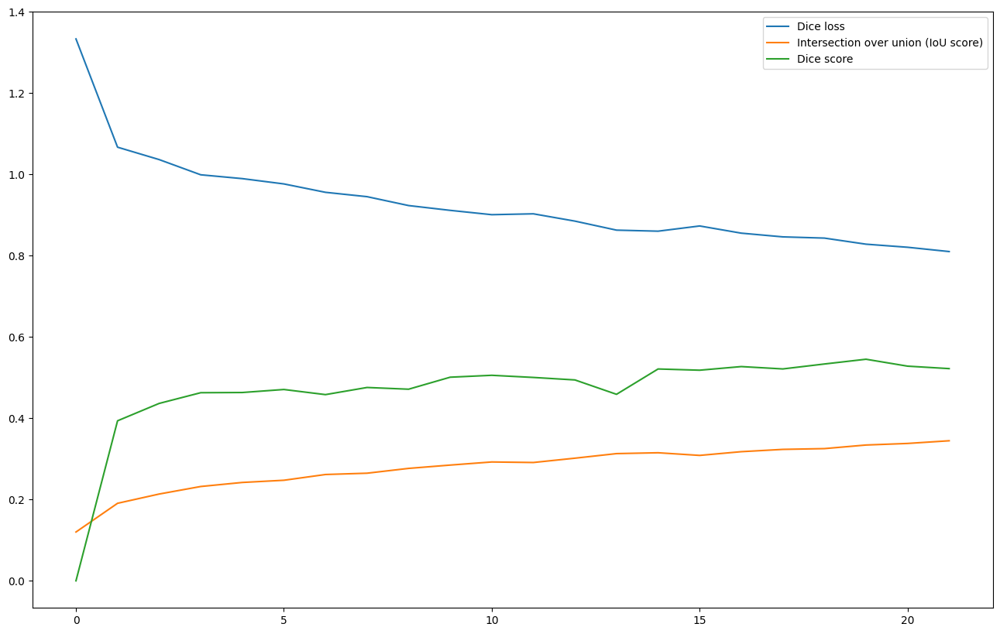

In [23]:
f = plt.figure(figsize=(16, 10))
plt.plot(train_loss, label='Dice loss')
plt.plot(train_iou, label='Intersection over union (IoU score)')
plt.plot(train_dice, label='Dice score')
plt.legend()
plt.show()

In [24]:
def test_model(model, val_loader, device):
    model.eval()
    dice_score = 0
    iou_metric = IOU()
    iou_score = 0

    with torch.no_grad():
        for x, y in tqdm(val_loader, desc="Testing"):
            x = x.to(device)
            y = y.to(device).unsqueeze(1)

            preds = torch.sigmoid(model(x))
            preds_binary = (preds > 0.5).float()

            dice_score += (2 * (preds_binary * y).sum()) / (
                (preds_binary + y).sum() + 1e-8
            )
            iou_score += iou_metric(preds_binary, y)

    avg_dice = dice_score / len(val_loader)
    avg_iou = iou_score / len(val_loader)

    print(f"Average Dice Score: {avg_dice:.4f}")
    print(f"Average IoU Score: {avg_iou:.4f}")

    return avg_dice, avg_iou

avg_dice, avg_iou = test_model(model, val_loader, DEVICE)

Testing: 100%|██████████| 34/34 [00:49<00:00,  1.44s/it]

Average Dice Score: 0.5221
Average IoU Score: 0.1500


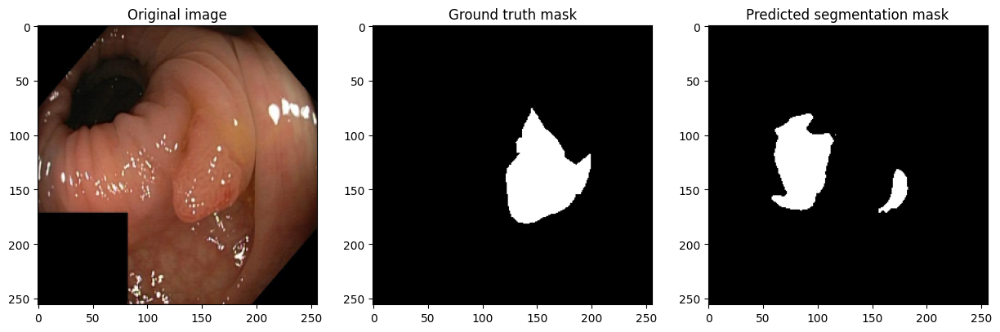

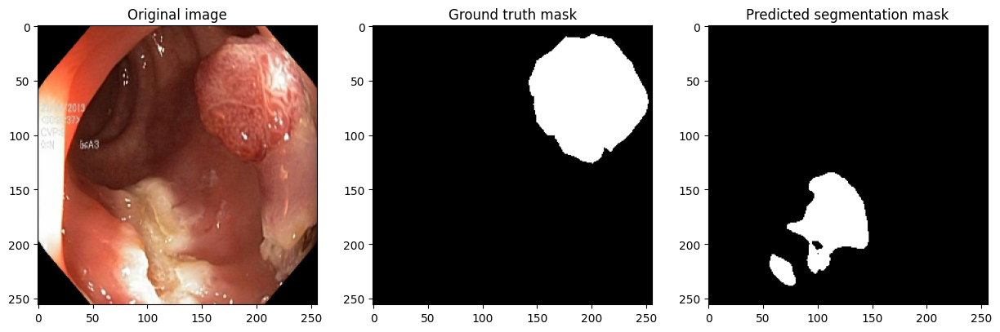

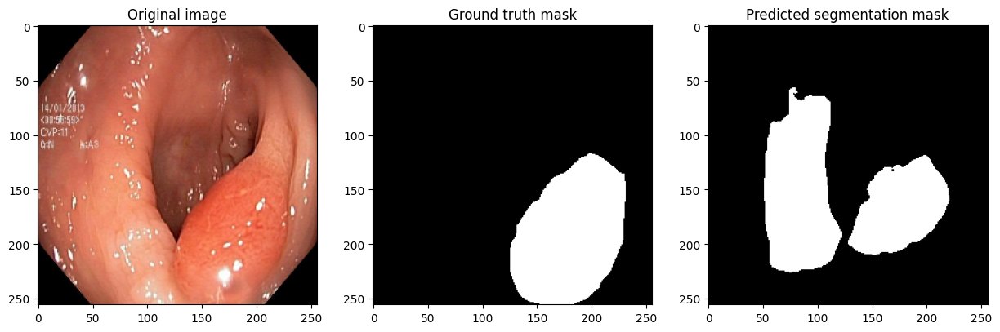

In [25]:
def visualize_predictions(model, val_loader, device, num_samples=3):
    model.eval()
    samples = 0

    with torch.no_grad():
        for x, y in val_loader:
            x = x.to(device)
            y = y.to(device).unsqueeze(1)
            preds = torch.sigmoid(model(x))
            preds_binary = (preds > 0.5).float()

            for i in range(x.size(0)):
                if samples >= num_samples:
                    break

                plt.figure(figsize=(15, 5))

                plt.subplot(1, 3, 1)
                plt.title("Original image")
                plt.imshow(np.transpose(x[i].cpu().numpy(), (1, 2, 0)))

                plt.subplot(1, 3, 2)
                plt.title("Ground truth mask")
                plt.imshow(y[i].cpu().numpy().squeeze(), cmap="gray")

                plt.subplot(1, 3, 3)
                plt.title("Predicted segmentation mask")
                plt.imshow(preds_binary[i].cpu(
                ).numpy().squeeze(), cmap="gray")

                plt.show()
                samples += 1

            if samples >= num_samples:
                break

visualize_predictions(model, val_loader, DEVICE)

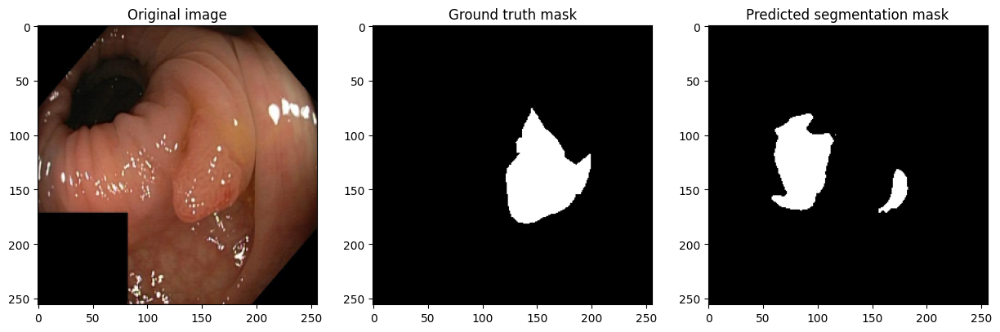

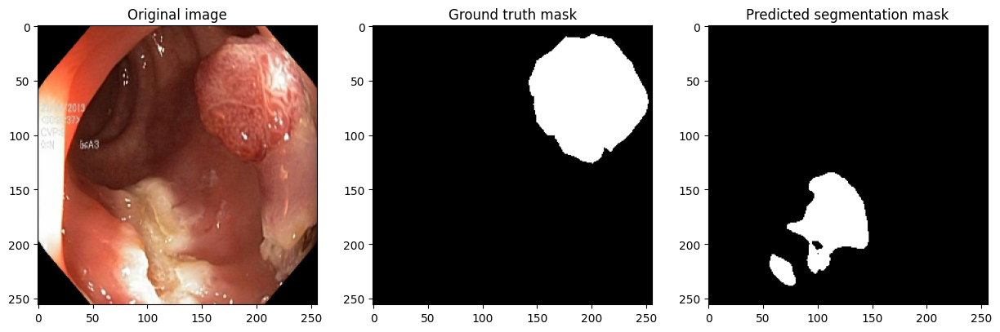

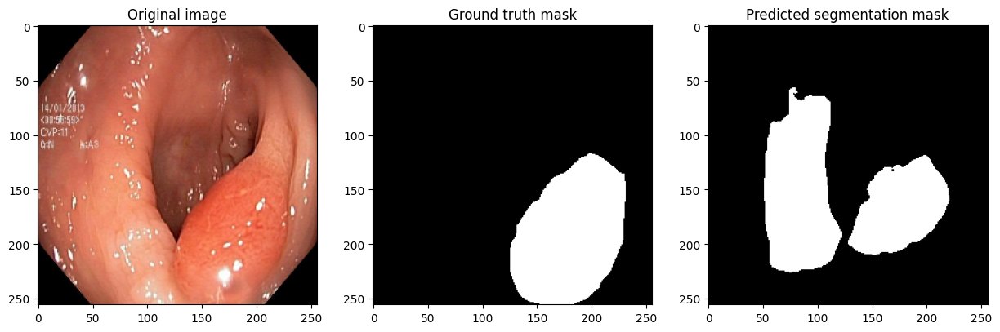

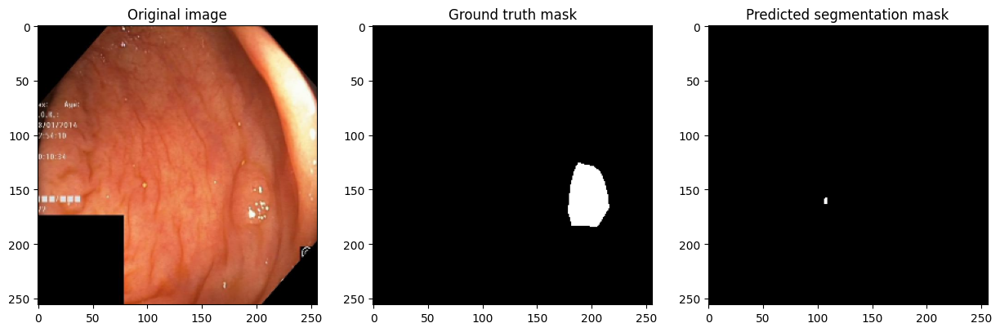

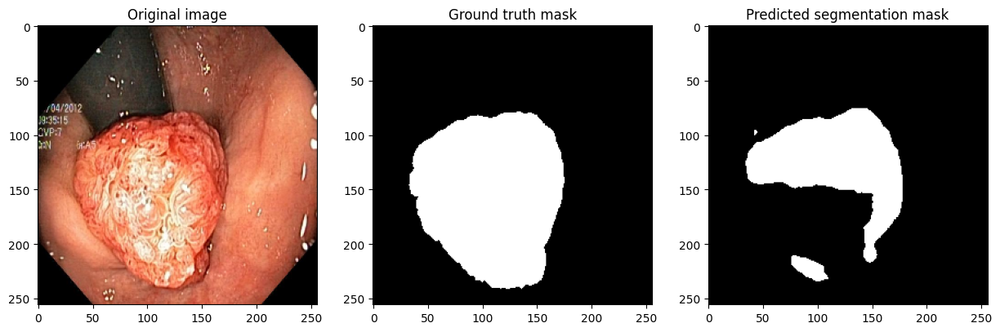

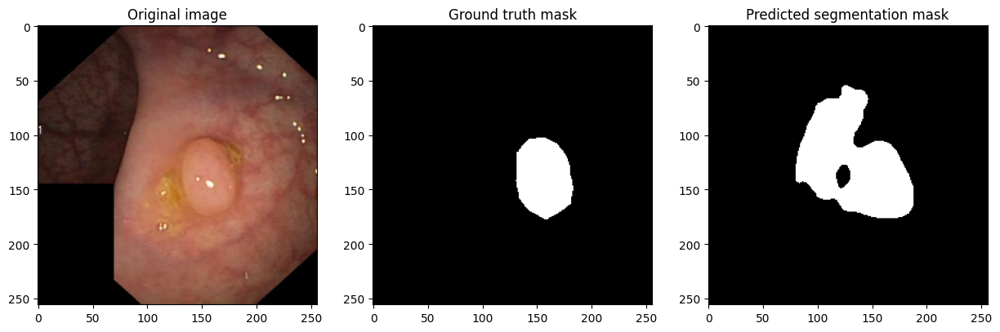

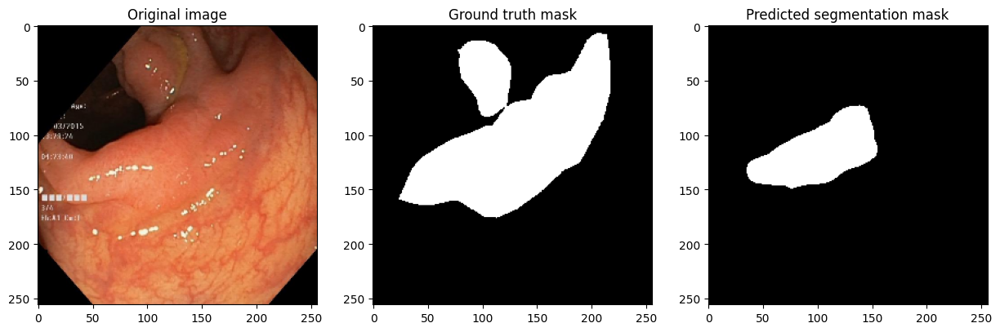

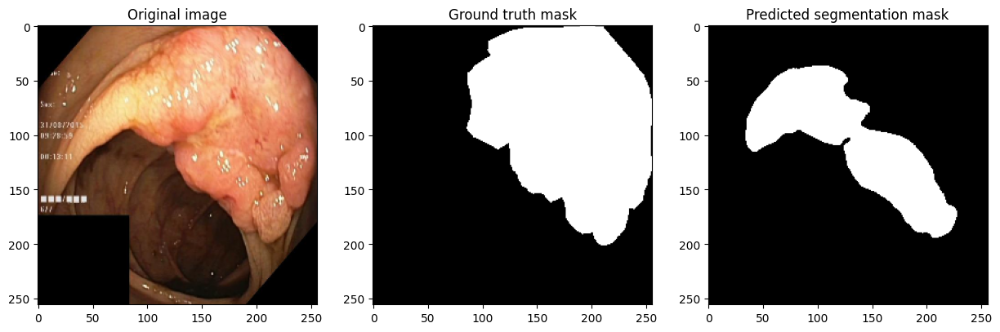

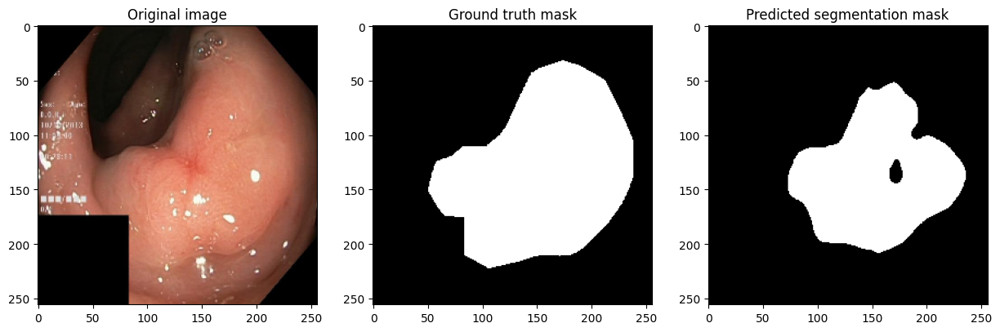

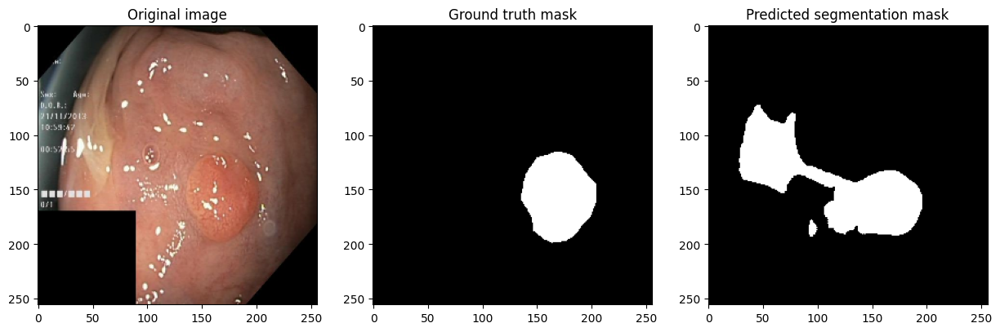

In [26]:
visualize_predictions(model, val_loader, DEVICE, num_samples=10)

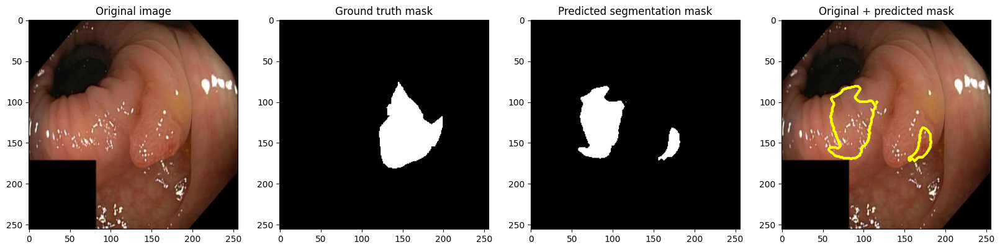

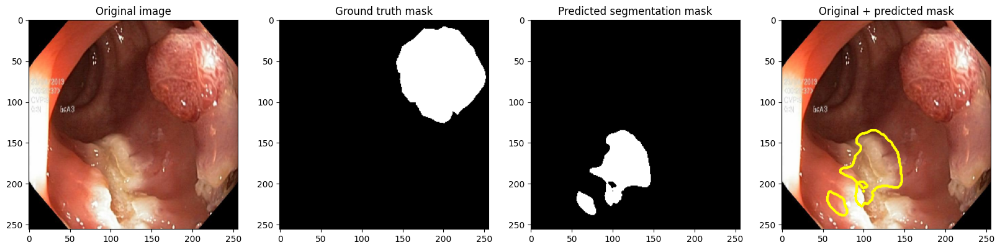

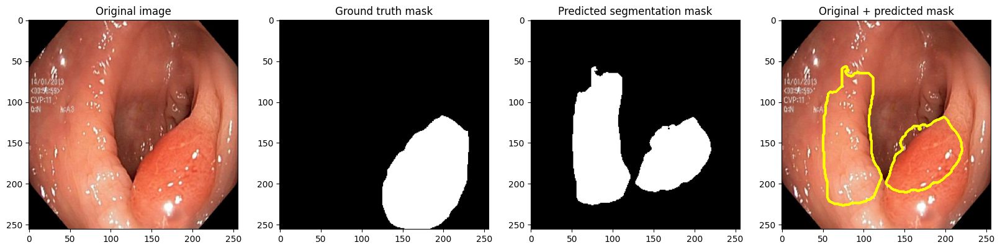

In [29]:
def visualize_predictions(model, val_loader, device, num_samples=3):
    model.eval()
    samples = 0

    with torch.no_grad():
        for x, y in val_loader:
            x = x.to(device)
            y = y.to(device).unsqueeze(1)
            preds = torch.sigmoid(model(x))
            preds_binary = (preds > 0.5).float()

            for i in range(x.size(0)):
                if samples >= num_samples:
                    break

                plt.figure(figsize=(20, 5))

                plt.subplot(1, 4, 1)
                plt.title("Original image")
                plt.imshow(np.transpose(x[i].cpu().numpy(), (1, 2, 0)))

                plt.subplot(1, 4, 2)
                plt.title("Ground truth mask")
                plt.imshow(y[i].cpu().numpy().squeeze(), cmap="gray")

                plt.subplot(1, 4, 3)
                plt.title("Predicted segmentation mask")
                plt.imshow(preds_binary[i].cpu(
                ).numpy().squeeze(), cmap="gray")

                plt.subplot(1, 4, 4)
                plt.title("Original + predicted mask")
                original_image = np.transpose(x[i].cpu().numpy(), (1, 2, 0))
                plt.imshow(original_image)

                mask = preds_binary[i].cpu().numpy().squeeze()
                mask_border = np.zeros_like(mask)
                mask_border[mask == 1] = 1
                plt.contour(mask_border, colors='yellow', linewidths=2)

                plt.show()
                samples += 1

            if samples >= num_samples:
                break


visualize_predictions(model, val_loader, DEVICE)

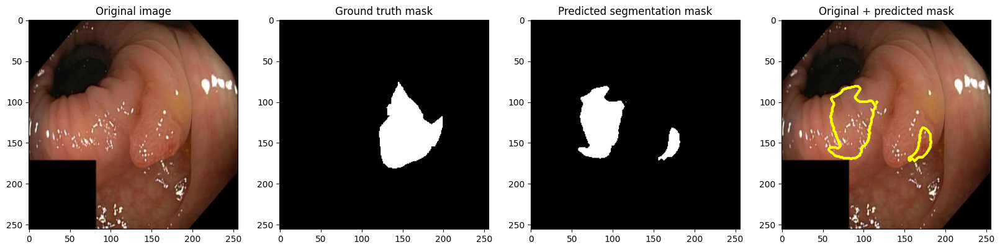

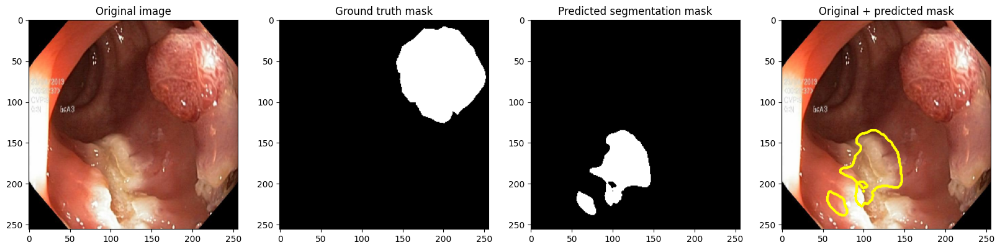

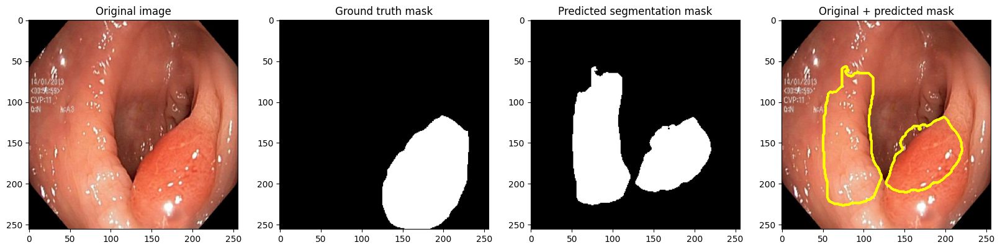

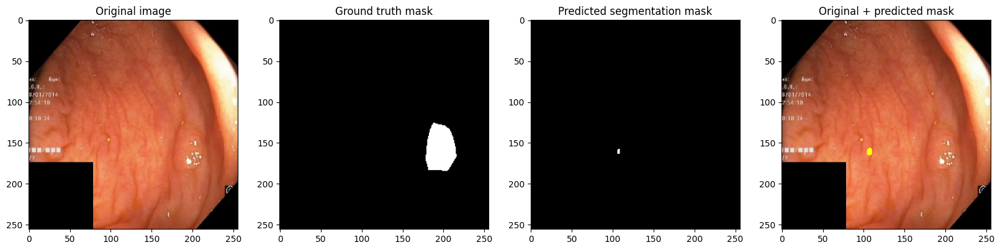

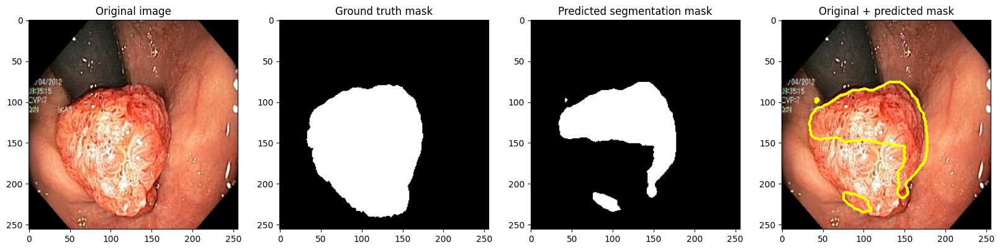

...

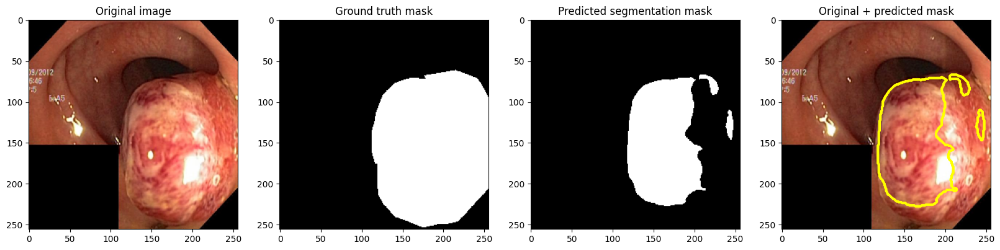

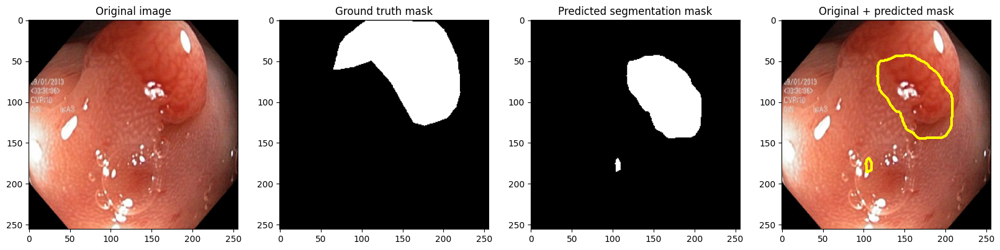

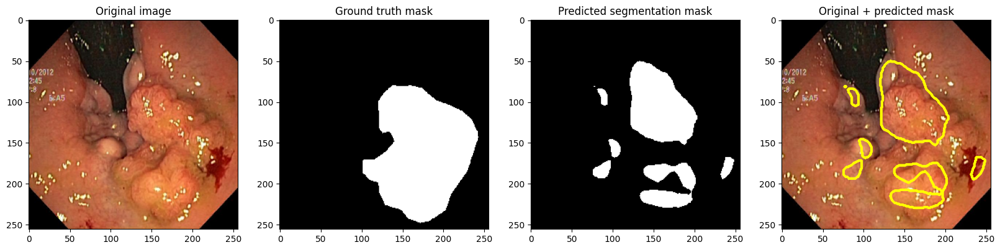

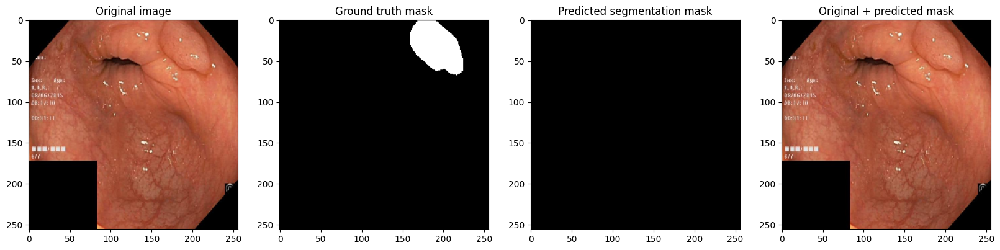

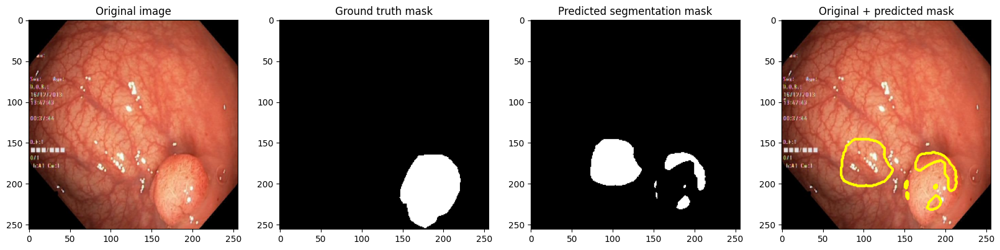

In [30]:
visualize_predictions(model, val_loader, DEVICE, num_samples=50)

In [31]:
# visualize_predictions(model, val_loader, DEVICE, num_samples=100)